# What Hikes Living Cost Index? EDA, Linear Regression, Geospatial map
#### _Titas Saha_
##### _2022-04-29_

## Introduction

### Goal: to find out which factors increase living cost index across the world

- First, I explore certain variables with **visualizations** to get an idea of what we have. 
- Next, I see the **correlation** among various factors to see how living cost is influenced. 
- Third, I use **linear regression** to determine which variables positively (or negatively) correlate with our outcome variable. 

### Results

- I find that cost of living index is highly positively correlated with 

    **1) overall cost of living and rent**

    **2) grocery**

    **3) restaurant price** 

- **North America, Australia**, and **Western Europe** have the higest cost of living index. Developing economies like **India** have the lowest cost of living index.

## Load Packages

In [1]:
#suppressPackageStartupMessages(install.packages(c("tidyverse", "dplyr","countrycode")))
library(dplyr)
library(tidyverse)
library(countrycode)
library(psych)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ stringr 1.4.0
✔ tidyr   1.2.0     ✔ forcats 0.5.1
✔ readr   2.1.2     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘psych’


The following objects are masked from ‘package:ggplot2’:

    %+%, alpha




## Reading dataset

In [2]:
df <- read.csv("../input/cost-of-living-index-2022/Cost_of_Living_Index_2022.csv", header=TRUE)

## Cleaing the dataset

In [3]:
# Let's check the summary
head(df)
summary(df)
str(df)
any(is.na(df))
ncol(df)

,Rank,Country,Cost.of.Living.Index,Rent.Index,Cost.of.Living.Plus.Rent.Index,Groceries.Index,Restaurant.Price.Index,Local.Purchasing.Power.Index
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,Afghanistan,20.37,2.72,12.09,14.92,12.41,23.04
2,2,Albania,35.50,8.47,22.83,29.32,25.82,30.19
3,3,Algeria,26.87,4.59,16.43,28.82,14.48,24.63
4,4,Argentina,34.69,7.71,22.04,28.17,33.32,30.72
5,5,Armenia,33.89,11.61,23.45,27.59,30.55,28.86
6,6,Australia,77.75,36.84,58.57,77.44,72.95,104.63


      Rank         Country          Cost.of.Living.Index   Rent.Index    
 Min.   :  1.0   Length:139         Min.   : 19.92       Min.   : 2.720  
 1st Qu.: 35.5   Class :character   1st Qu.: 34.72       1st Qu.: 9.515  
 Median : 70.0   Mode  :character   Median : 44.68       Median :13.930  
 Mean   : 70.0                      Mean   : 50.19       Mean   :19.292  
 3rd Qu.:104.5                      3rd Qu.: 62.58       3rd Qu.:25.070  
 Max.   :139.0                      Max.   :146.04       Max.   :98.580  
 Cost.of.Living.Plus.Rent.Index Groceries.Index  Restaurant.Price.Index
 Min.   : 12.09                 Min.   : 14.92   Min.   : 12.41        
 1st Qu.: 23.31                 1st Qu.: 31.20   1st Qu.: 25.29        
 Median : 31.26                 Median : 40.22   Median : 34.56        
 Mean   : 35.71                 Mean   : 46.64   Mean   : 43.44        
 3rd Qu.: 44.87                 3rd Qu.: 56.59   3rd Qu.: 54.92        
 Max.   :123.80                 Max.   :148.66   M

'data.frame':	139 obs. of  8 variables:
 $ Rank                          : int  1 2 3 4 5 6 7 8 9 10 ...
 $ Country                       : chr  "Afghanistan" "Albania" "Algeria" "Argentina" ...
 $ Cost.of.Living.Index          : num  20.4 35.5 26.9 34.7 33.9 ...
 $ Rent.Index                    : num  2.72 8.47 4.59 7.71 11.61 ...
 $ Cost.of.Living.Plus.Rent.Index: num  12.1 22.8 16.4 22 23.4 ...
 $ Groceries.Index               : num  14.9 29.3 28.8 28.2 27.6 ...
 $ Restaurant.Price.Index        : num  12.4 25.8 14.5 33.3 30.6 ...
 $ Local.Purchasing.Power.Index  : num  23 30.2 24.6 30.7 28.9 ...


[1] FALSE

[1] 8

- There are no NA's
- All columns are of character type. Except for country, the rest need to be converted to numeric datatype
- Rank is not required

In [4]:
#datatype conversion
df = df %>% mutate(across(.cols=c(1,3:8), .fns=as.numeric))
#Removing rank
df <- df[-1]
str(df)

'data.frame':	139 obs. of  7 variables:
 $ Country                       : chr  "Afghanistan" "Albania" "Algeria" "Argentina" ...
 $ Cost.of.Living.Index          : num  20.4 35.5 26.9 34.7 33.9 ...
 $ Rent.Index                    : num  2.72 8.47 4.59 7.71 11.61 ...
 $ Cost.of.Living.Plus.Rent.Index: num  12.1 22.8 16.4 22 23.4 ...
 $ Groceries.Index               : num  14.9 29.3 28.8 28.2 27.6 ...
 $ Restaurant.Price.Index        : num  12.4 25.8 14.5 33.3 30.6 ...
 $ Local.Purchasing.Power.Index  : num  23 30.2 24.6 30.7 28.9 ...


## Data Exploration

### 1. Cost of living index
- Let's first visualize the distribution of the outcome variable

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
“Removed 3 rows containing non-finite values (stat_bin).”
Warning message:
“Removed 3 rows containing non-finite values (stat_density).”
Warning message:
“Removed 2 rows containing missing values (geom_bar).”


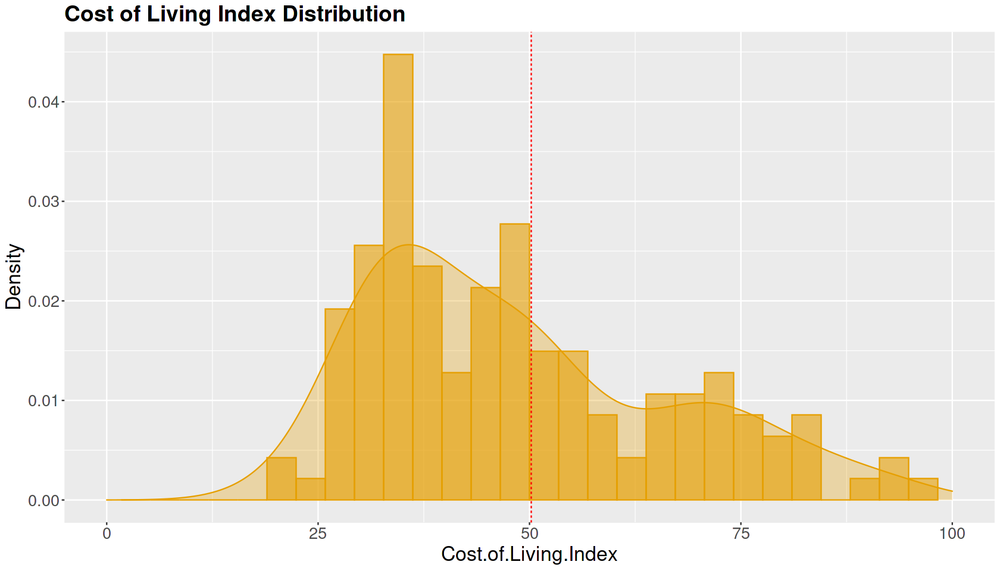

In [5]:
options(repr.plot.width = 14, repr.plot.height = 8)

ggplot(df, aes(x=`Cost.of.Living.Index`))+
  geom_histogram(aes(y=..density..), position="identity", fill="#E69F00", color="#E69F00",alpha=0.6)+
  geom_density(fill= "#E69F00", alpha=0.3, color="#E69F00")+
  geom_vline(xintercept = mean(df$`Cost.of.Living.Index`), linetype= "dashed", color="red")+
  xlim(0,100)+
  labs(title="Cost of Living Index Distribution", y="Density")+
  theme(text=element_text(size=20), plot.title= element_text(size=22, face="bold"))

### All Indices (Rent, Grocery, Purchase Power, Restaurant Price)
- Let's take a look at the distribution curve of all numerical variables.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



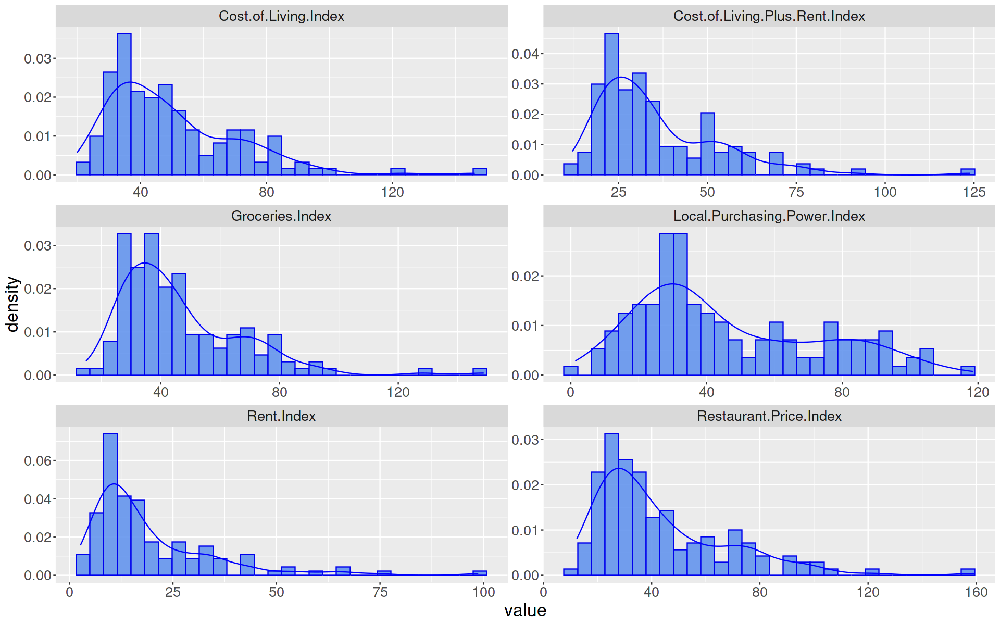

In [6]:
options(repr.plot.width = 16, repr.plot.height = 10)
df %>%
  keep(is.numeric)%>%
  gather()%>%
  ggplot(aes(value, fill=value))+
  geom_histogram(aes(y=..density..), position="identity",color="blue2", fill="cornflowerblue", alpha=0.9)+
  geom_density(color="blue")+
  facet_wrap(~ key, scales ="free", ncol=2)+
  theme(text=element_text(size=20))

#### **Top 10 countries with the highest cost of living index**

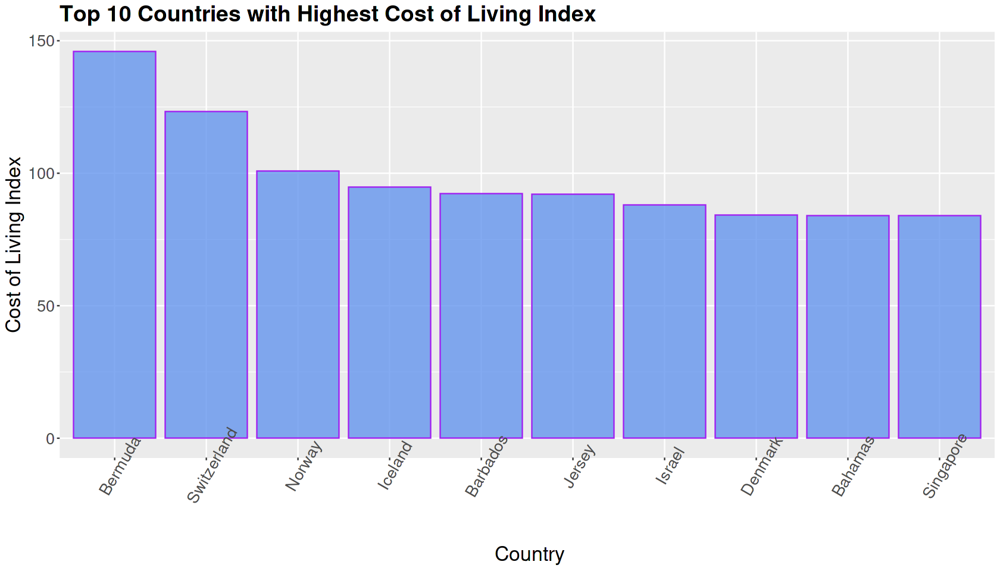

In [7]:
options(repr.plot.width = 14, repr.plot.height = 8)
df %>%
  arrange(desc(df$Cost.of.Living.Index)) %>%
  slice(1:10) %>%
  ggplot(., aes(x=reorder(Country, -`Cost.of.Living.Index`),y=`Cost.of.Living.Index`))+
  geom_bar(stat='identity', color="purple", fill="cornflowerblue", alpha=0.8)+
  scale_fill_brewer(palette = "Greens")+
  labs(x= " Country", y="Cost of Living Index", title="Top 10 Countries with Highest Cost of Living Index ")+
  theme(axis.text.x = element_text(angle=60), text = element_text(size=20), plot.title = element_text(size=22, face="bold"))

#### **Top 10 countries with the highest rent index**

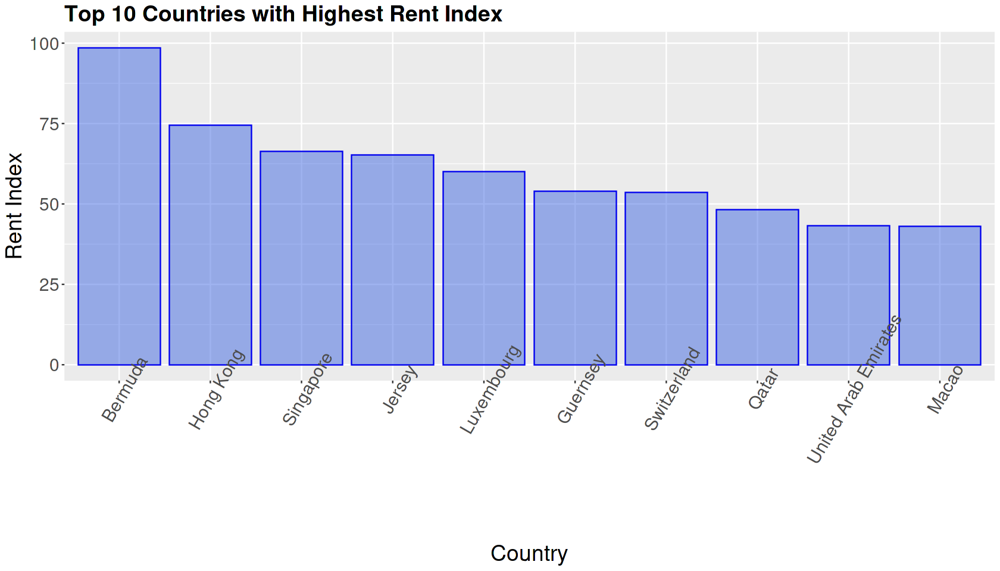

In [8]:
options(repr.plot.width = 14, repr.plot.height = 8)
df %>%
  arrange(desc(df$Rent.Index)) %>%
  slice(1:10) %>%
  ggplot(., aes(x=reorder(Country, -`Rent.Index`),y=`Rent.Index`))+
  geom_bar(stat='identity', color="blue2", fill="royalblue", alpha=0.5)+
  scale_fill_brewer(palette = "Greens")+
  labs(x= "Country", y="Rent Index", title="Top 10 Countries with Highest Rent Index ")+
  theme(axis.text.x = element_text(angle=60), text = element_text(size=22), plot.title = element_text(size=22, face="bold"))

## Linear Regression

### Correlation Matrix

 Cost.of.Living.Index   Rent.Index     Cost.of.Living.Plus.Rent.Index
 Min.   :0.6872       Min.   :0.6381   Min.   :0.6953                
 1st Qu.:0.8622       1st Qu.:0.7994   1st Qu.:0.9227                
 Median :0.9500       Median :0.8191   Median :0.9379                
 Mean   :0.9000       Mean   :0.8357   Mean   :0.9106                
 3rd Qu.:0.9724       3rd Qu.:0.9136   3rd Qu.:0.9657                
 Max.   :1.0000       Max.   :1.0000   Max.   :1.0000                
 Groceries.Index  Restaurant.Price.Index Local.Purchasing.Power.Index
 Min.   :0.6265   Min.   :0.6908         Min.   :0.6265              
 1st Qu.:0.8122   1st Qu.:0.8130         1st Qu.:0.6504              
 Median :0.8942   Median :0.8847         Median :0.6890              
 Mean   :0.8632   Mean   :0.8658         Mean   :0.7230              
 3rd Qu.:0.9583   3rd Qu.:0.9303         3rd Qu.:0.6942              
 Max.   :1.0000   Max.   :1.0000         Max.   :1.0000              

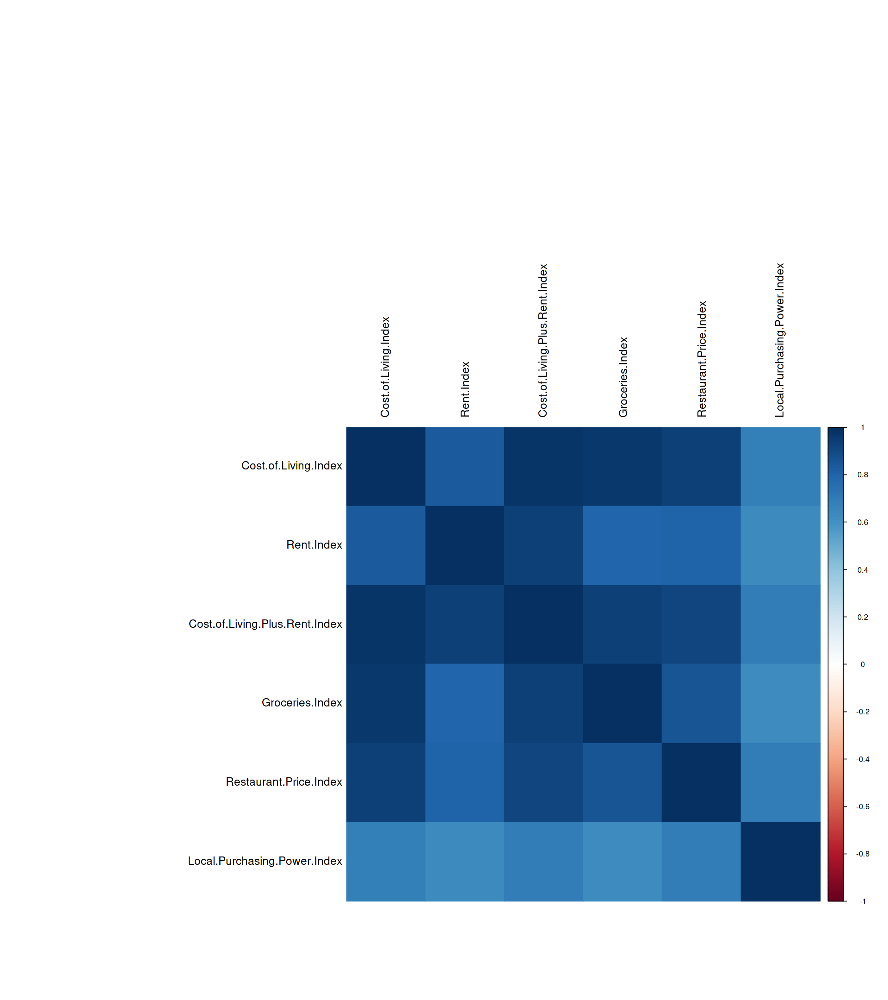

In [9]:
df_cor <- cor(select_if(df, is.numeric))
summary(df_cor)
options(repr.plot.width = 16, repr.plot.height = 18)
corrplot::corrplot(df_cor,method="color", tl.cex=1.2, tl.col = "black")

- All variable are positively correlated to each other. 
- Cost of living index tends to be highly positively correlated with cost of living and rent, grocery, and restaurant price indices

### Regression model

In [10]:
m <- lm(df$`Cost.of.Living.Index`~., data=select_if(df, is.numeric))
summary(m)


Call:
lm(formula = df$Cost.of.Living.Index ~ ., data = select_if(df, 
    is.numeric))

Residuals:
       Min         1Q     Median         3Q        Max 
-0.0138766 -0.0054135  0.0007739  0.0050219  0.0155829 

Coefficients:
                                 Estimate Std. Error   t value Pr(>|t|)    
(Intercept)                    -1.472e-03  2.086e-03    -0.706   0.4815    
Rent.Index                     -8.826e-01  2.004e-04 -4403.822   <2e-16 ***
Cost.of.Living.Plus.Rent.Index  1.883e+00  3.714e-04  5069.842   <2e-16 ***
Groceries.Index                -1.593e-04  1.298e-04    -1.227   0.2220    
Restaurant.Price.Index         -1.603e-04  8.001e-05    -2.003   0.0472 *  
Local.Purchasing.Power.Index    2.756e-05  3.120e-05     0.883   0.3787    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.006926 on 133 degrees of freedom
Multiple R-squared:      1,	Adjusted R-squared:      1 
F-statistic: 2.504e+08 on 5 and 133 DF,  p-value: < 2.2e-

#### **Interpretation**

- The linear regression results show that the median is close to 0, the minimum and maximum values are almost equidistant from 0, and quantiles 1 and 3 are also almost equidistant from 0
- Cost of living plus rent index is significantly positively correlated with cost of living index
- Rent index is significantly negatively correlated with cost of living index
- Restaurant price also tends to negatively correlate with cost of living index
- The multiple R-squared value is 1 , indicating that cost of living index explains 100% of the variation in other variables

#### **Plot of p-values**

,p-value,coefficient,variables
,<dbl>,<dbl>,<chr>
(Intercept),0.48154003,-1.472225e-03,(Intercept)
Rent.Index,0.00000000,-8.826039e-01,Rent.Index
Cost.of.Living.Plus.Rent.Index,0.00000000,1.882912e+00,Cost.of.Living.Plus.Rent.Index
Groceries.Index,0.22202910,-1.592891e-04,Groceries.Index
Restaurant.Price.Index,0.04719919,-1.602655e-04,Restaurant.Price.Index
Local.Purchasing.Power.Index,0.37867479,2.756042e-05,Local.Purchasing.Power.Index


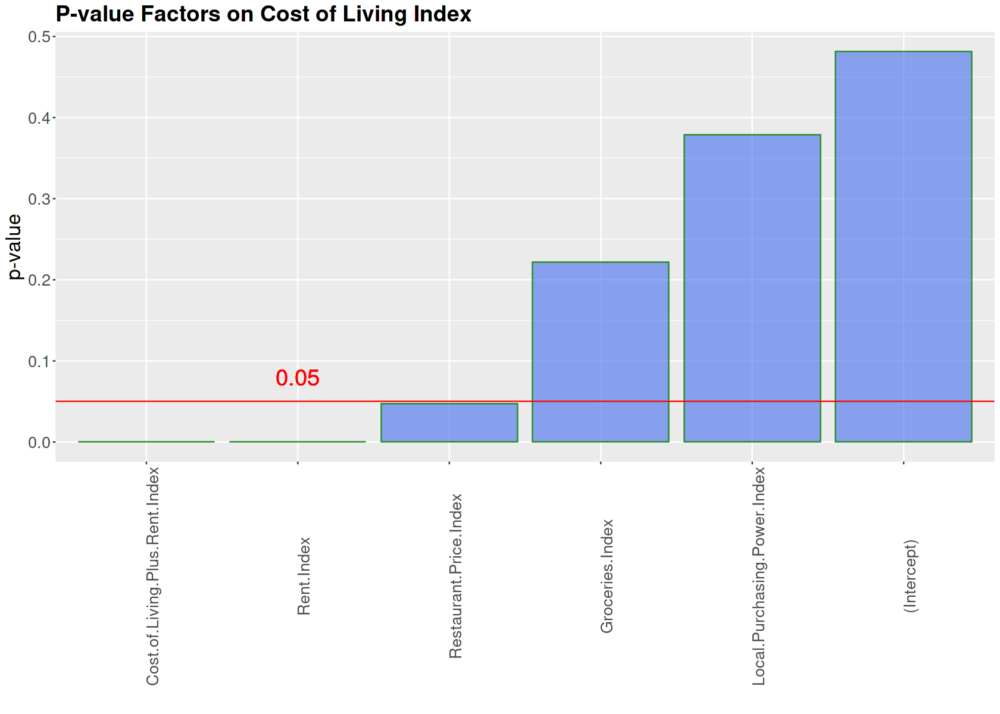

In [11]:
#Extraction
pvalue <- data.frame(summary(m)$coefficients[,c('Pr(>|t|)', 'Estimate')])
pvalue$var_name <- rownames(pvalue)
colnames(pvalue) <-c('p-value', 'coefficient','variables')
View(pvalue)

#Plot
options(repr.plot.width = 14, repr.plot.height = 10)
ggplot(pvalue, aes(x=reorder(`variables`, `p-value`), y=`p-value`))+
  geom_col(fill='royalblue2', color="forestgreen", alpha = 0.6)+
  labs(title="P-value Factors on Cost of Living Index", x= " ")+
  theme(axis.text.x = element_text(angle=90), text=element_text(size=20),plot.title=element_text(size=22, face="bold") )+
  geom_hline(yintercept = 0.05, col="red")+
  geom_text(aes(x=2,y=0.08), label="0.05", size=8, color="red")

#### **How does cost of living index vary across continents?**

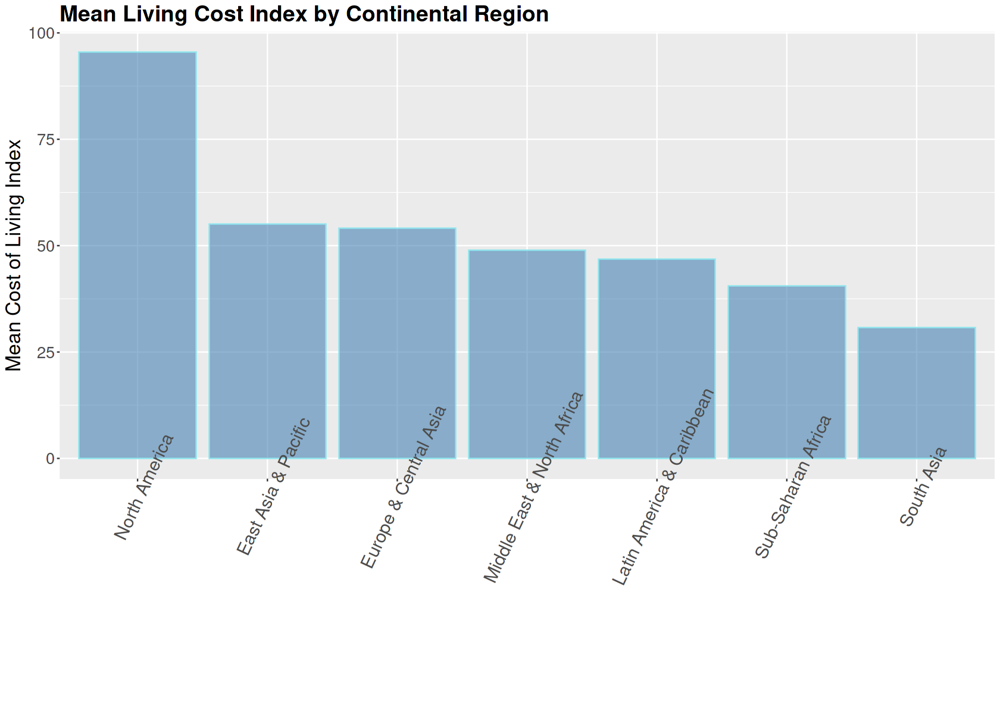

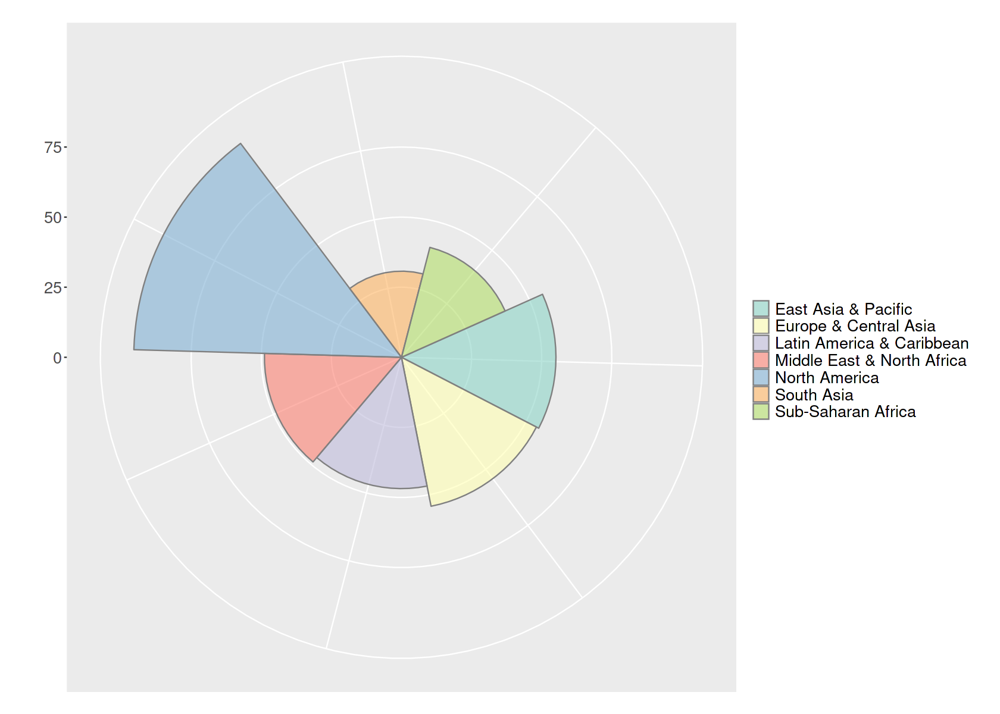

In [12]:
df$Continent <- countrycode(sourcevar = df$Country, origin = "country.name",destination = "region")

df_continent <- df %>% select(`Cost.of.Living.Index`,`Continent`) %>%
  group_by(Continent) %>%
  summarise(Mean_Cost_of_Living_Index = mean(`Cost.of.Living.Index`))

options(repr.plot.width = 14, repr.plot.height = 10)
ggplot(df_continent, aes(x=reorder(`Continent`,-`Mean_Cost_of_Living_Index`), y=`Mean_Cost_of_Living_Index`))+
  geom_col(color="cadetblue2", fill="steelblue", alpha=0.6)+
  scale_fill_brewer(palette = "Paired")+
  theme(axis.text.x = element_text(angle=65, size=18), text=element_text(size=20), plot.title=element_text(size=22, face="bold"))+
  labs(y="Mean Cost of Living Index", x=" ", title="Mean Living Cost Index by Continental Region")


options(repr.plot.width = 14, repr.plot.height = 10)
ggplot(df_continent, aes(x=`Continent`, y=`Mean_Cost_of_Living_Index`, fill=`Continent`))+
  geom_bar(width=1,
           stat="identity",
           color="gray50",
           alpha=.6)+
  coord_polar("x", start=20)+
  theme(axis.text.x=element_blank(),
        legend.position = "right", 
        legend.text = element_text(size=16),
        legend.title=element_blank(),
        axis.text.y = element_text(size=16),
        plot.title=element_text(size=12, hjust=1, face="bold"))+
  labs(x=" ", y=" ",
       title = " ")+
  scale_fill_brewer(palette = "Set3")

## Geospatial Visualization

**Let's visualize the cost of living index across countries and continents**

##### Geospatial graph packages and libraries

In [13]:
#install.packages(c("rworldmap", "ggplot2", "sf", "scales", "rnaturalearth", "rnaturalearthdata", "plotly"))
library(ggplot2)
library(sf)
library(rworldmap)
library(plotly)

Linking to GEOS 3.8.0, GDAL 3.0.4, PROJ 6.3.1; sf_use_s2() is TRUE

Loading required package: sp

### Welcome to rworldmap ###

For a short introduction type : 	 vignette('rworldmap')


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


The following object is masked from ‘package:httr’:

    config




### **World Map with Cost of Living Index**

137 codes from your data successfully matched countries in the map
2 codes from your data failed to match with a country code in the map
106 codes from the map weren't represented in your data


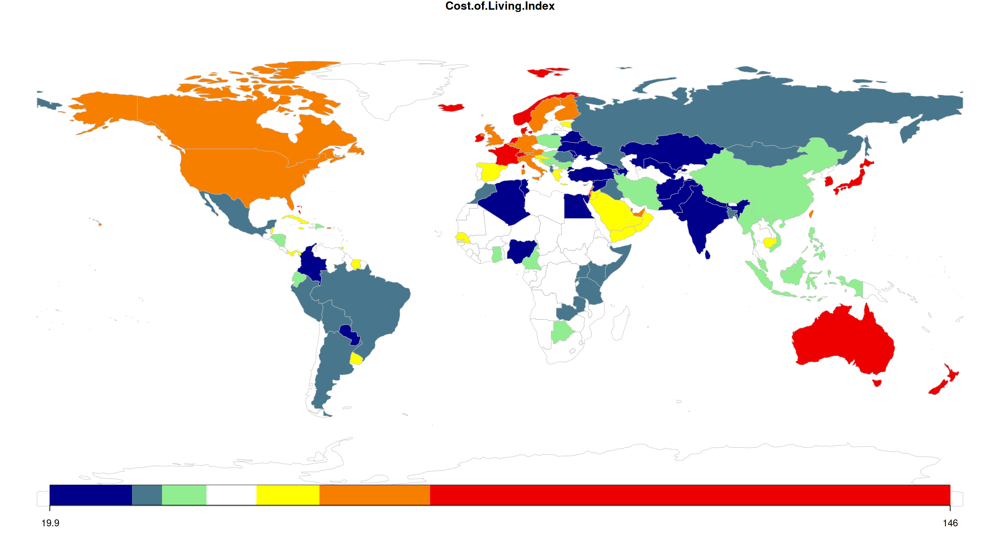

In [14]:
options(repr.plot.width = 18, repr.plot.height = 10)

index.map <- joinCountryData2Map(df, joinCode = "NAME", nameJoinColumn = "Country")
par(mar=c(0,0,1,0))
mapCountryData(index.map, nameColumnToPlot="Cost.of.Living.Index", colourPalette = "diverging")

#### Australia, North America, and Western European countries have the highest cost of living index. India, Pakistan, parts of Africa and South America have lower cost of living index. 
(This is pretty obvious but its great to see the data show this :D)

##### _The below chunk is an additional interactive map I wanted to create. Sadly, it runs successfully before comitting but the notebook fails after comitting. Any idea why?_


In [15]:
## Interactive Map: Cost of Living Index

df1 <- df %>%  select(`Country`, `Cost.of.Living.Index`)
colnames(df1) <- c("region", "Cost_of_Living_Index")
mapdata <- map_data("world")
mapdata <- right_join(mapdata, df1, by="region")


map1 <- ggplot(mapdata, aes(x= long, y= lat, group=group))+
  geom_polygon(aes(fill = Cost_of_Living_Index), color="black")+
  scale_fill_gradient(name="Cost of Living Index", low="yellow", high="red", na.value = "gray50")+
  theme(axis.text.x = element_blank(),
        axis.text.y = element_blank(),
        axis.ticks = element_blank(),
        axis.title.x = element_blank(),
        axis.title.y = element_blank(), 
        rect = element_blank(),
       legend.position= 'bottom')

map2 <- ggplotly(map1) %>%
  highlight(
    "plotly_hover",
    selected = attrs_selected(line = list(color = "black")))
map2
htmlwidgets::saveWidget(map2, "Index_World.html")


HTML widgets cannot be represented in plain text (need html)